# Background Removal mit TSVD

## Überblick

Viele Anwendungen im Bereich Machine Learning führen zu Problemstellungen der
numerischen linearen Algebra für sehr große Matrizen.
Ein Beispiel dafür ist die (abgeschnittene) Singulärwertzerlegung
beim **Background Removal** in Videosequenzen.

An diesem Beispiel werden verschiedene Zugänge zur (T)SVD vorgestellt und
mit den Standardverfahren verglichen.

## Motivation

Es gibt eine sehr einfache Methode, wie man in Videos Vorder- und Hintergrund
separieren kann.

Man wandelt zunächst das Video in eine Matrix $X$ um, wobei jeder Frame in einen
Spaltenvektor (mit entsprechender Farbinformation pro Pixel) transformiert wird.

Betrachten wir nun die erste Hauptrichtungen $u_1$.
Der Vektor $u_1$ stellt ein spezielles Bild dar.
Projizieren wir alle Frames des Videos darauf, so erhalten
wir große Varianzen, d.h. $u_1$ stellt eine Art Maske dar,
die auf stark variable Bereiche im Video (sprich bewegte Objekte)
sehr sensibel reagiert, d.h. $u_1$ wird im wesentlichen
Informationen zum Hintergrund enthalten.

Mit wachsendem Index $i$ werden die Varianzen der
Projektion auf $u_i$ immer kleiner, d.h. dort werden
die eher "dynamischen" Elemente des Videos erfasst,
also die sich bewegenden Objekte.

Um jetzt bewegte Objekte und Hintergrund zu trennen geht
man wie folgt vor:

- man berechnet eine kleine Anzahl $k$ von Hauptrichtungen, d.h.
\begin{equation*} 
u_i, \sigma_i, v_i, \quad i=1,\ldots,k,
\quad
X = U\Sigma V^T
\end{equation*}

- damit erzeugt man eine Matrix 
$X_k$ als TSVD von $X$ durch
\begin{align*} 
X_k 
&= U_k \Sigma_k V_k^T,
\\
U_k 
&= \big(u_1,\ldots,u_k \big),
\\
\Sigma_k 
&= 
\begin{pmatrix}
\sigma_1\\
&\ddots \\
&& \sigma_k
\end{pmatrix}
,
\\
V_k &= \big(v_1,\ldots,v_k \big),
\end{align*}
die weitgehend die Information über den Hintergrund enthält
($X_k$ ist eine Rang-$k$-Approximation von $X$)

- die Informationen zum Vordergrund erhält man dann durch
\begin{equation*} 
Y_k = X - X_k
\end{equation*}

Wir wenden die Methode auf das folgende Video an (Movies von [SBMnet](http://scenebackgroundmodeling.net/) oder
[CDNET](http://www.changedetection.net/))

In [1]:
import numpy as np
import scipy as sp
import scipy.linalg as spl
import matplotlib.pyplot as plt

import moviepy.editor as mpe

import gc

%matplotlib inline

video = mpe.VideoFileClip("DatenNotebooks/Video_003.avi")
video.ipython_display(maxduration = 300)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Wir haben dabei

In [2]:
print('Anzahl Frames = {}'.format(int(video.duration * video.fps) + 1))

f = video.get_frame(0)
hbt = f.shape
print('Höhe x Breite x Farbtiefe = {}'.format(hbt))

Anzahl Frames = 795
Höhe x Breite x Farbtiefe = (240, 320, 3)


d.h. wir bekommen eine Matrix $X$ mit den Dimensionen

In [3]:
def v2m(video):
    nframes = int(video.duration * video.fps) + 1
    npixel  = (np.array(video.size)).prod()
    
    A = np.empty((npixel * 3, nframes))
    
    t = np.linspace(0, video.duration, nframes)
    for k,tk in enumerate(t):
        fk = video.get_frame(tk)
        A[:,k] = fk.flatten() / 255.0
    
    return(A)


def m2v(X, hbt):
    Xs = (X - X.min()) / (X.max() - X.min())
    
    L = [Xs[:, k].reshape(hbt)*255 for k in range(X.shape[1])]
    v = mpe.ImageSequenceClip(L, fps = 25)
    
    return(v)


X = v2m(video)
X.shape

(230400, 795)

und folgender Besetzungsstruktur

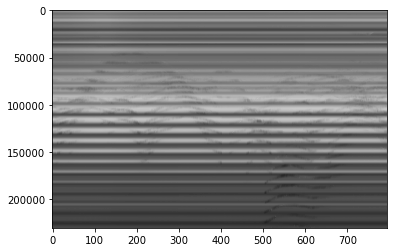

In [4]:
plt.imshow(X, cmap = 'gray')
plt.axis('auto');

## SVD mit Standardverfahren

Die Matrix ist zwar groß, aber da sie nur wenige Spalten hat, können wir uns "trauen", die Standard-SVD aus [SciPy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.linalg.svd.html) zu verwenden:

In [5]:
%time U, s, VT = spl.svd(X, full_matrices=False)

CPU times: user 1min 41s, sys: 8.44 s, total: 1min 50s
Wall time: 16.6 s


Die (skalierten) Varianzen $\sigma_i^2$ fallen sehr schnell ab

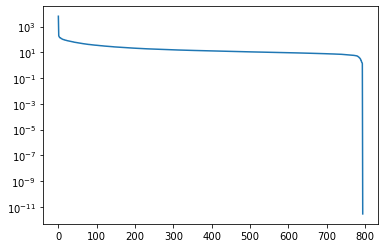

In [6]:
plt.semilogy(s);

Die ersten Hauptrichtungen ergeben folgende Masken

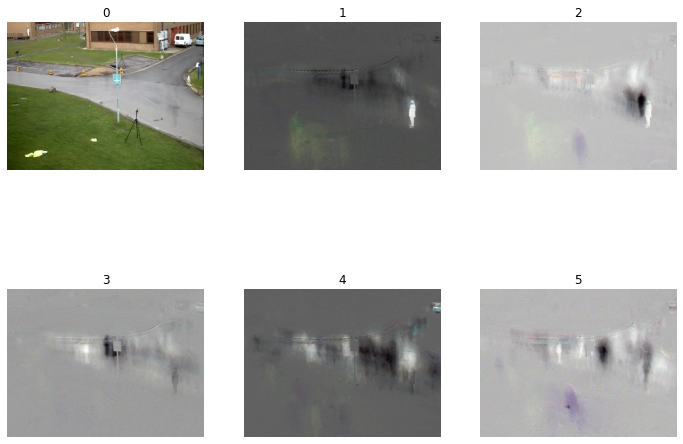

In [7]:
def frameplot(UU, hbt, n = 3):
    U = UU.copy()    
    if U.ndim < 2:
        U = U.reshape(-1,1)
    
    mi, ni = U.shape

    m = (ni - 1) // n + 1

    if m==1:
        n = ni

    fak = 12.0 / max(hbt)
    fig, ax = plt.subplots(m, n, figsize = [hbt[1] * fak, hbt[0] * fak])
    ax = np.array([ax]).ravel()
        
    for axk in ax:
        axk.axis('off')

    for k, axk in enumerate(ax[:ni]):
        u = U[:,k].reshape(hbt)
        if u.mean() < 0:
            u = -u
        u = (u - u.min()) / (u.max() - u.min())
        axk.imshow(u)
        #axk.matshow(images[k].reshape(mi,pi), cmap = plt.cm.gray_r)
        axk.set_title(str(k))
        
frameplot(U[:,:6], hbt)

Schon die zweite enthält nur noch wenig Information über den Hintergrund.
Deshalb wählen wir hier $k=2$ und zerlegen $X$ in $X_k$ und $Y_k = X - X_k$. 

In [8]:
k = 2

Xk = U[:,:k] * s[:k] @ VT[:k,:]

Yk = X - Xk

Für den Hintergrund erhalten wir dann

In [9]:
vXk = m2v(Xk, hbt)
vXk.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


bzw. für den Vordergrund

In [10]:
vYk = m2v(Yk, hbt)
vYk.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Das Ergebnis ist nicht perfekt, aber dafür ist es sehr einfach zu erzeugen.

Der Flaschenhals dabei ist natürlich die (T)SVD. Da wir für jeden Frame des Videos
eine Spalte in der Matrix $X$ erhalten, wird diese bei längeren Video-Sequenzen so groß,
das es nicht mehr möglich ist, eine vollständige SVD zu berechnen.

Andererseits benötigen wir hier nur einige wenige der größten Singulärwerte und
-vektoren (und diese vielleicht auch nicht mit äußerster Genauigkeit).

Deshalb betrachten wir jetzt Verfahren, die auf solche Fälle zugeschnitten sind
und mit wenig Aufwand eine (approximative) TSVD erzeugen.

## Iterative Verfahren

### Krylov Raum Verfahren

In der numerischen linearen Algebra gibt es einige Verfahren, die mit relativ wenig Aufwand
einen Teil der Eigenwerte/Eigenvektoren bzw. Sigulärwerte/Singulärvektoren 
einer Matrix $X$ bestimmen können.

Getriggert durch Gleichungssysteme die bei der Diskretisierung partieller Differentialgleichungen entstehen sind die Verfahren oft so aufgebaut,
dass der wesentliche Aufwand aus Matrix-Vektor-Produkten mit $A$ bzw. $A^T$
besteht. Ist der Aufwand zur Berechnung dieser Produkte gering (z.B. bei sehr
dünn besetzten Matrizen), dann sind diese Verfahren sehr effizient.

Ein triviales Beispiel ist die Vektoriteration zur Berechnung des größten Eigenwerts und des zugehörigen Eigenvektors.

Die am weitesten verbreiteten Methoden basieren aber wieder auf Krylov-Raum-Projektionen.
Die in SciPy implementierte Funktion [scipy.sparse.linalg.svds](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.linalg.svds.html) basiert
z.B. auf [ARPACK](https://www.caam.rice.edu/software/ARPACK/).

Wir berechnen damit jetzt die ersten 5 Singulärwerte und -vektoren und
vergleichen die Laufzeit mit oben.

In [11]:
gc.collect()

from scipy.sparse.linalg import svds

k = 5
%time Us, ss, VsT = svds(X, k)

CPU times: user 7.18 s, sys: 5.73 ms, total: 7.19 s
Wall time: 6.85 s


Der Zeitgewinn ist hier noch nicht spektakulär. Bei größeren
Matrizen wird er aber sehr deutlich.

Jetzt vergleichen wir die Singulärwerte

In [12]:
ss[::-1]

array([6492.19400221,  198.0855534 ,  168.71892036,  154.61039747,
        137.69877822])

mit denen von oben

In [13]:
s[:k]

array([6492.19400221,  198.0855534 ,  168.71892036,  154.61039747,
        137.69877822])

Die Ergebnisse sind identisch.

### Singulärwertberechnung mit Projected Gradient Descent

Die Berechnung von Singulärwerten und Singulärvektoren kann man
als restringiertes konvexes Optimierungsproblem beschreiben. Für den ersten Spaltenvektor $v_1$  von $V$ gilt
\begin{equation*} 
v_1 = \text{argmax}_{\|v\|_2^2=1}f(v) = \text{argmax}_{\|v\|_2^2 \leq 1}f(v)
\end{equation*}
mit
\begin{equation*} 
f(v) = \|X v\|_2^2,
\quad
f(v_1) = \sigma_1^2.
\end{equation*}
Allgemein gilt mit $V_k = (v_1,\ldots,v_k)$
\begin{equation*} 
v_k = \text{argmax}_{\|v\|_2^2=1, v\bot V_{k-1}}f(v) = \text{argmax}_{\|v\|_2^2 \leq 1, v\bot V_{k-1}}f(v)
\end{equation*}
mit
\begin{equation*} 
f(v) = \|X v\|_2^2,
\quad
f(v_k) = \sigma_{k}^2.
\end{equation*}

Ein einfaches Verfahren zum Lösen dieser Optimierungsprobleme ist
**Projected Gradient Descent**:

- man führt einen Schritt des GD Verfahrens

- die neu berechnete Näherung $v^{\text{neu}}$ wird dann so projiziert,
  dass sie die Nebenbedingung erfüllt, d.h. man sucht einen Vektor
  der die Nebenbedingung erfüllt und minimalen Abstand zu
  $v^{\text{neu}}$ hat

In unserem Fall ist Projektion recht einfach:

- $v_1$: $v^{\text{neu}}$ wird einfach auf Länge $1$ skaliert

- $v_k$: von $v^{\text{neu}}$ wird die Projektion auf $V_k$ subtrahiert
und das Resultat auf Länge $1$ skaliert

Damit erhalten wir die Singulärwerte

In [14]:
gc.collect();

def mf(v):
    Xv = X.dot(v)
    return(-Xv.dot(Xv))

def mf1(v):
    Xv = X.dot(v)
    return(-2 * X.T.dot(Xv))

def GDp(w0, l1, pro, gamma = 1.0, nit = 10):
    w  = w0.copy()
    w = pro(w)
    
    ww = [w]
    
    for k in range(nit):
        w = w - gamma * l1(w)
        w = pro(w)
        ww.append(w)
    
    return ww


m, n = X.shape

v0 = np.ones(n)

#pro1 = lambda w : w / np.linalg.norm(w ,2)

def pro1(w):
    normw = np.linalg.norm(w ,2)
    if normw > 1.0:
        w = w / normw
    return w

vv = GDp(v0, mf1, pro1)

v1 = vv[-1]
s1 = np.sqrt(-mf(vv[-1]))
u1 = X.dot(v1)/s1

#def pro2(w):
#    ws = w - v1.dot(w) * v1
#    return(ws / np.linalg.norm(ws ,2))

def pro2(w):
    ws = w - v1.dot(w) * v1
    normws = np.linalg.norm(ws ,2)
    if normws > 1.0:
        ws = ws / normws
    return ws

vv = GDp(v0, mf1, pro2)

v2 = vv[-1]
s2 = np.sqrt(-mf(vv[-1]))
u2 = X.dot(v2) / s2

(s1, s2)

(6492.194002211024, 198.0030562202398)

Im Vergleich dazu betrachten wir die Werte von oben

In [15]:
s[:2]

array([6492.19400221,  198.0855534 ])

Die Werte sind nahezu identisch. Als Vordergund-Video erhalten wir

In [16]:
Xk = np.c_[u1, u2] * np.array([s1, s2]) @ np.c_[v1, v2].T

Yk = X - Xk

vYk = m2v(Yk, hbt)
vYk.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Singulärwertberechnung über Unterraum-Iteration

Die Singulärwerte von $X$ sind die Wurzeln der Eigenwerte der
semidefiniten Matrix $A = X^TX$.
Ein einfaches Verfahren zur Berechnung des größten Eigenwerts
von $A$ ist die Vektoriteration

- wähle $v^{(0)}$ mit $\| v^{(0)} \|_2 = 1$, 

- wiederhole für $i=0,1,\ldots$
  \begin{align*}
  w^{(i+1)} &= Av^{(i)} = X^TX v^{(i)}\\
  v^{(i+1)} &= \frac{w^{(i+1)}}{\|w^{(i+1)}\|_2}\\  
  \lambda^{(i+1)} &= (v^{(i)}, w^{(i+1)})_2
  \end{align*}
  
Unter einigen Voraussetzungen konvergiert $\lambda^{(i)}$
gegen den größten Eigenwert von $A = X^TX$ und 
$v^{(i)}$ gegen den zugehörigen Eigenvektor $v_1$.

Mit der Vektoriteration können wir also
$\sigma_1$ und $v_1$ bestimmen und wegen
\begin{align*}
Xv_1 = U\Sigma V^T v_1 = \sigma_1 u_1
\end{align*}
auch $u_1$.

Um mehr als einen Eigenwert bzw. Eigenvektor zu berechnen,
kann man die Vektoriteration einfach zu einer Unterraum-Iteration
erweitern. Statt Vektoren $v^{(i)}$ betrachtet man
Matrizen
\begin{align*}
V^{(i)} = \big(v^{(i)}_1,\ldots,v^{(i)}_k \big)
\end{align*}
und sorgt dafür, dass die Spalten orthonormal sind:

- wähle $V^{(0)}= \big(v^{(0)}_1,\ldots,v^{(0)}_k \big)$ 
  mit $v^{(0)}_j$ orthonormal

- wiederhole für $i=0,1,\ldots$
  \begin{align*}
  \tilde{U}^{(i+1)} &=X V^{(i)}\\
  W^{(i+1)} &= AV^{(i)} = X^T \tilde{U}^{(i+1)}\\
  Q^{(i+1)}R^{(i+1)} &= W^{(i+1)}\\
  V^{(i+1)} &= Q^{(i+1)}\\  
  \Lambda^{(i+1)} &= \mathrm{diag}(R^{(i+1)})
  \end{align*}
  
Unter geeigneten Voraussetzungen konvergiert 
- $\Lambda^{(i)}$
  gegen eine Diagonalmatrix, die (in absteigender
  Reihenfolge) die $k$ größten Eigenwerte von $A = X^T X$,
  (also die Quadrate der $k$ größten Singulärwerte von $X$)
  enthält

- $V^{(i)}$ gegen eine Matrix $V_k$, deren orthonormale
  Spalten die zugehörigen Eigenvektoren (bzw. Singulärvektoren)
  $v_j$, $j=1,\ldots,k$, sind

Analog zur Vektoriteration erhalten wir daraus wegen
\begin{align*}
Xv_j = U\Sigma V^T v_j = \sigma_j u_j,
\quad j=1,\ldots,k,
\end{align*}
auch die zugehörigen linken Singulärvektoren
$U_k = (u_1,\ldots, u_k)$.

In unserem Fall ist 
\begin{align*}
X\in\mathbb{R}^{m\times n},
\quad
V^{(i)}\in\mathbb{R}^{n\times k},
\quad
k \ll m
\end{align*}
und
\begin{align*}
U^{(i+1)} &=X V^{(i)} \in\mathbb{R}^{m\times k},\\
W^{(i+1)} &= X^T U^{(i+1)}\in\mathbb{R}^{n\times k}.
\end{align*}
Der Aufwand für die beiden Matrix-Matrix-Produkte
zur Berechnung von $U^{(i+1)}$ und $W^{(i+1)}$
ist somit nicht sehr hoch. Das selbe gilt auch
für die QR-Zerlegung $Q^{(i+1)}R^{(i+1)} = W^{(i+1)}$.

Wir wenden nun die Unterraum-Iteration auf unser Background-Removal-Problem an. 
Für $V^{(0)}$ erzeugen wir eine zunächst eine zufällige
$m\times k$-Matrix, deren Spalten wir dann orthonormalisieren.

Als Approximationen der Singulärwerte erhalten wir

In [17]:
def subspace(X, k = 5, nit = 10):
    m, n = X.shape

    # Startvektoren für V, orthonormal
    V,_ = np.linalg.qr(np.random.randn(n, k))

    for i in range(nit):
        U   = X.dot(V)
        W   = X.T.dot(U)
        V,R = np.linalg.qr(W)   

    d  = np.diag(R)
    s  = np.sqrt(np.abs(d))
    
    sneg = s.copy()
    sneg[d<0] = -sneg[d<0]
    
    U = U / sneg
        
    return U, s, V


#k = 3

nit = 10

np.random.seed(17)

Uk, sk, Vk = subspace(X, k, nit)

sk

array([6492.19400221,  198.04867298,  163.03493323,  137.79295522,
        158.93329203])

Ein Vergleich mit den Ergebnissen der vollständigen SVD zeigt,
das selbst mit wenigen Iterationen akzeptable Näherungen erzeugt
werden.

In [18]:
s[:k]

array([6492.19400221,  198.0855534 ,  168.71892036,  154.61039747,
        137.69877822])

Das gilt auch für die Singulärvektoren, wie der
folgende Vergleich der $u_k$ zeigt.

Die Singulärvektoren der Unterraum-Iteration

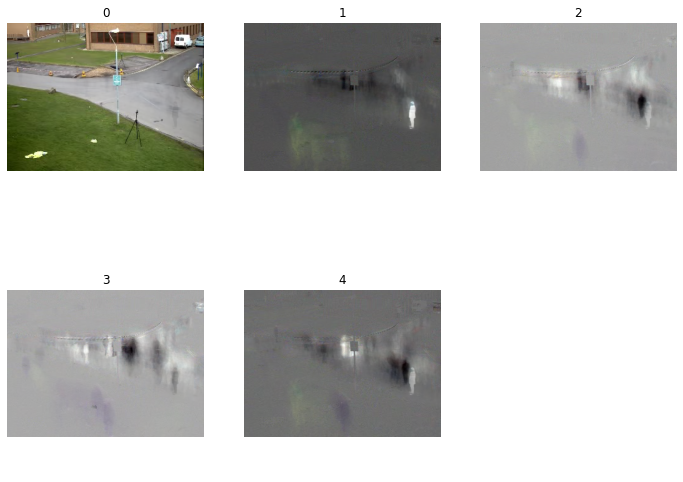

In [19]:
frameplot(Uk[:,:k], hbt)

sind von denen der vollständigen SVD

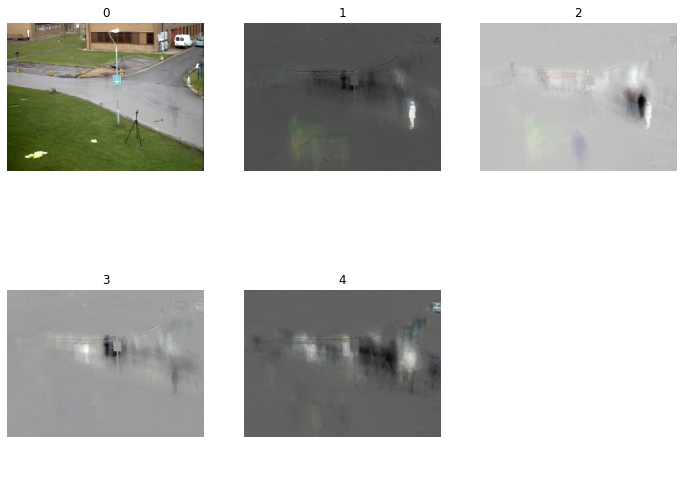

In [20]:
frameplot(U[:,:k], hbt)

visuell praktisch nicht zu unterscheiden.

**Bemerkung:** Für $k=m$ und $V^{(0)} = I$ ist die Unterraum-Iteration
äquivalent zu einer QR-Iteration ohne Shift angewandt auf $A = X^T X$:

- aus der Iterationsvorschrift erhält man
  \begin{align*}
  V^{(i+1)}R^{(i+1)} = A V^{(i)},
  \end{align*}
  wobei alle Matrizen quadratisch aus $\mathbb{R}^{m\times m}$ sind

- da die $V^{(i)}$ orthonormal sind gilt damit insbesondere
  \begin{align*}
  {V^{(i)}}^{-1} = {V^{(i)}}^T
  \end{align*}

- betrachten wir nun
  \begin{align*}
  A^{(i)} = {V^{(i)}}^T A V^{(i)}
  \end{align*}
  dann gilt $A^{(0)} = A$ und
  \begin{equation*}
  A^{(i)}=\underbrace{ {V^{(i)}}^T V^{(i+1)} }_{ =:Q^{(i+1)} }   R^{(i+1)}
  \end{equation*}  
  bzw.
  \begin{align*}
  A^{(i+1)} 
  &= {V^{(i+1)}}^T A V^{(i+1)}\\
  &= {V^{(i+1)}}^T A V^{(i)} {V^{(i)}}^T V^{(i+1)}\\
  &= {V^{(i+1)}}^T V^{(i+1)}R^{(i+1)} {V^{(i)}}^T V^{(i+1)}\\
  &= R^{(i+1)} Q^{(i+1)},
  \end{align*}
  insgesamt also
  \begin{align*}
  A^{(0)} &= A,\\
  A^{(i)} &= Q^{(i+1)} R^{(i+1)},\\
  A^{(i+1)} &= R^{(i+1)} Q^{(i+1)}
  \end{align*}

## Randomized SVD

[Scikit Learn](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html) stellt eine Methode zur Berechnung der TSVD zur Verfügung. 

In [21]:
del Xk, Yk, vYk 
gc.collect()

from sklearn.decomposition import TruncatedSVD

doc = (TruncatedSVD.__doc__)
for d in doc.splitlines()[:30]:
    print(d)

Dimensionality reduction using truncated SVD (aka LSA).

    This transformer performs linear dimensionality reduction by means of
    truncated singular value decomposition (SVD). Contrary to PCA, this
    estimator does not center the data before computing the singular value
    decomposition. This means it can work with sparse matrices
    efficiently.

    In particular, truncated SVD works on term count/tf-idf matrices as
    returned by the vectorizers in :mod:`sklearn.feature_extraction.text`. In
    that context, it is known as latent semantic analysis (LSA).

    This estimator supports two algorithms: a fast randomized SVD solver, and
    a "naive" algorithm that uses ARPACK as an eigensolver on `X * X.T` or
    `X.T * X`, whichever is more efficient.

    Read more in the :ref:`User Guide <LSA>`.

    Parameters
    ----------
    n_components : int, default=2
        Desired dimensionality of output data.
        Must be strictly less than the number of features.
        Th

Über den Parameter `algorithm` kann man unterschiedliche Algorithmen
auswählen.

### ARPACK

Bei `algorithm = 'arpack'` benutzt Scikit Learn ARPACK, also
die selbe Bibliothek die auch Scipy für dünn besetzte Matrizen
einsetzt. Dementsprechend sind die Ergebnisse und die Laufzeiten
vergleichbar.

In [22]:
tsvd_arpack = TruncatedSVD(n_components = k, algorithm = 'arpack')

#fit_transform(X) berechnet U_k * S_k, die V_k stehen in components_
%time Xk = tsvd_arpack.fit_transform(X).dot(tsvd_arpack.components_) 

tsvd_arpack.singular_values_

Yk = X - Xk
vYk = m2v(Yk, hbt)
vYk.ipython_display()

CPU times: user 10.7 s, sys: 164 ms, total: 10.8 s
Wall time: 7.94 s
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Randomized

Bei `algorithm = 'randomized'` erhalten wir folgende Resultate:

In [23]:
del Xk, Yk, vYk
gc.collect()

tsvd_rand = TruncatedSVD(n_components = k, algorithm = 'randomized')

#fit_transform(X) berechnet U_k * S_k, die V_k stehen in components_
%time Xk = tsvd_rand.fit_transform(X).dot(tsvd_rand.components_) 

tsvd_rand.singular_values_

Yk = X - Xk
vYk = m2v(Yk, hbt)
vYk.ipython_display()

CPU times: user 25.4 s, sys: 383 ms, total: 25.8 s
Wall time: 4.13 s
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Die Ergebnisse sind von den oben fast nicht zu unterscheiden, die Laufzeit ist allerdings nochmal deutlich geringer.

Die Funktionsweise des Verfahrens soll anhand einer (sehr stark) vereinfachten Variante
erklärt werden (**Gaussian Projection**).
Um eine Approximation der ersten $k$ Singulärwerte und -vektoren von $X\in\mathbb{R}^{m \times n}$ zu berechnen,
erzeugen wir eine zufällige Matrix
\begin{equation*} 
\Omega\in\mathbb{R}^{m \times (k+p)},
\quad
\omega_{ij} \sim \mathcal{N}(0,1)
\quad
\text{iid}
\end{equation*}
mit $k+p\ll n$ und berechnen dann für die (sehr viel kleinere) Matrix
\begin{equation*} 
\tilde{X} = X\Omega \in\mathbb{R}^{m \times (k+p)}
\end{equation*}
die SVD mit einem Standardverfahren.
Dies kann mehrfach wiederholt werden mit anschließender Mittelung der Ergebnisse.

Vergleichen wir die erhaltenen Näherungen für die Singulärwerte

In [24]:
del Xk, Yk, vYk
gc.collect();

In [25]:
def GaussProjection(A, s = 1):
    m,n = A.shape
    
    Om = np.random.randn(n, s) / np.sqrt(s)
    
    C = A.dot(Om)
    
    return(C)

m,n = X.shape


kp  = 4
nav = 10

Ukp  = np.zeros((m, kp))
skp  = np.zeros(kp)

for i in range(nav):
    Xkp = GaussProjection(X, kp)
    Ui, si, VTi = sp.linalg.svd(Xkp, full_matrices=False)
    
    Ukp  += Ui
    skp  += si

Ukp  /= nav
skp  /= nav

skp

array([7193.80590422,  447.86687315,  405.07333403,  360.15226648])

mit denen von oben

In [26]:
s[:kp]

array([6492.19400221,  198.0855534 ,  168.71892036,  154.61039747])

so fallen einige Abweichungen auf (die in Scikit Learn deutlich kleiner sind).

In [27]:
k = 2

Uk = Ukp[:,:k]

Xk = Uk.dot(Uk.T.dot(X))

Yk = X - Xk

Das damit erzeugte Video ist trotzdem durchaus brauchbar.

In [28]:
vYk = m2v(Yk, hbt)
vYk.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## Zusammenfassung

Anhand des Background Removal bei Videos haben wir für die (T)SVD zahlreiche verschiedene
numerische Algorithmen vorgestellt und bezüglich Performance miteinander verglichen:

- Standardverfahren ([SciPy](scipy.linalg.svd), [LAPACK](http://www.netlib.org/lapack/explore-html/db/db4/dgesdd_8f_source.html))

- Krylov-Raum-Methoden ([ARPACK](https://www.caam.rice.edu/software/ARPACK/))

- Projected Gradient Descent

- Unterraum-Iteration

- Randomized (T)SVD ([Scikit Learn](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html), Gaussian Projection)